# Dangerous Farm Insects

## Import Library & Dataset

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
import cv2
from PIL import Image, UnidentifiedImageError, ImageEnhance, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = False
from pathlib import Path
from collections import Counter, defaultdict
import hashlib
import shutil
from tqdm import tqdm
import random
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras import layers, models
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

In [4]:
data_path = Path("farm_insects")  
valid_exts = (".png", ".jpg", ".jpeg")

classes = sorted([d.name for d in data_path.iterdir() if d.is_dir()])
print(f"Total kelas: {len(classes)}")
print("Daftar kelas:", classes[:10])

Total kelas: 15
Daftar kelas: ['Africanized Honey Bees (Killer Bees)', 'Aphids', 'Armyworms', 'Brown Marmorated Stink Bugs', 'Cabbage Loopers', 'Citrus Canker', 'Colorado Potato Beetles', 'Corn Borers', 'Corn Earworms', 'Fall Armyworms']


In [5]:
def count_total_images(folder_path):
    total = 0
    per_kelas = {}

    # Loop subfolder
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)

        if os.path.isdir(class_folder):
            # Count file per class
            jumlah_gambar = len([
                f for f in os.listdir(class_folder)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))
            ])
            per_kelas[class_name] = jumlah_gambar
            total += jumlah_gambar

    return total, per_kelas

In [6]:
total_images, image_per_class = count_total_images(data_path)
print(f"Total gambar: {total_images}")

Total gambar: 1578


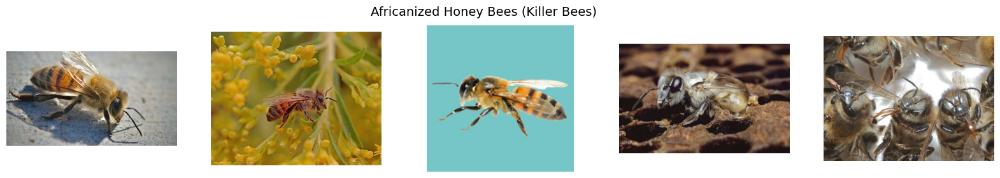

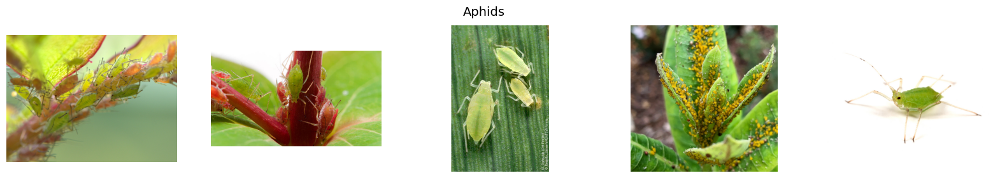

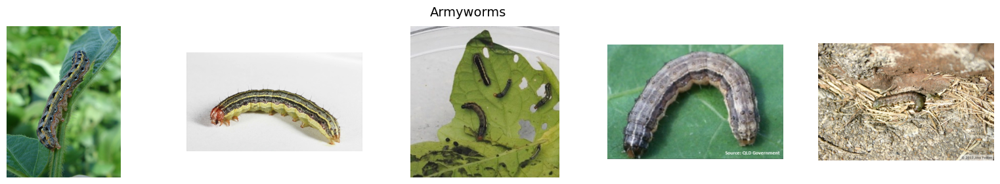

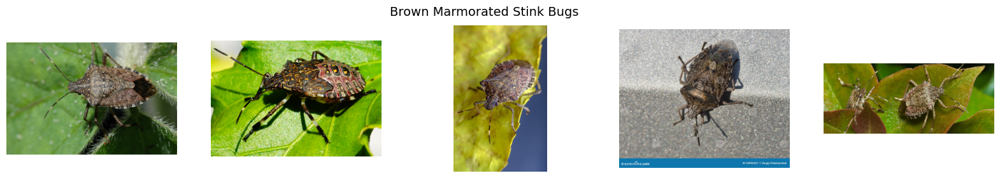

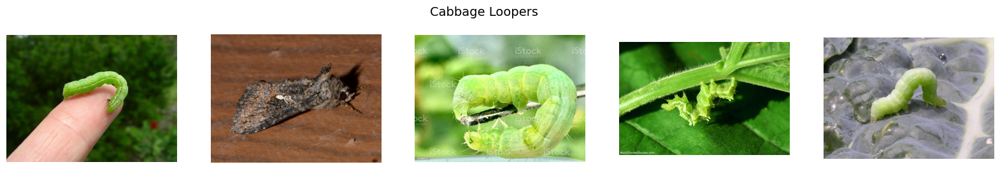

...

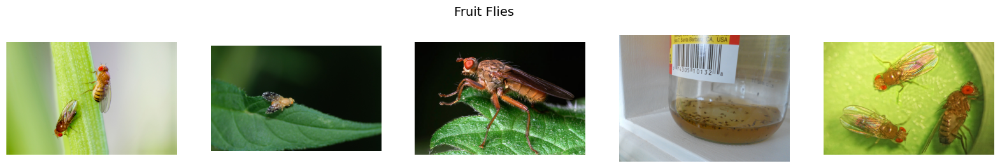

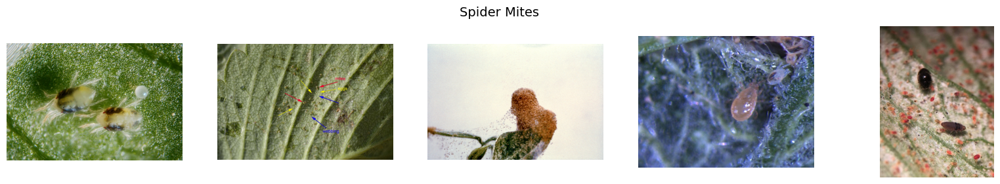

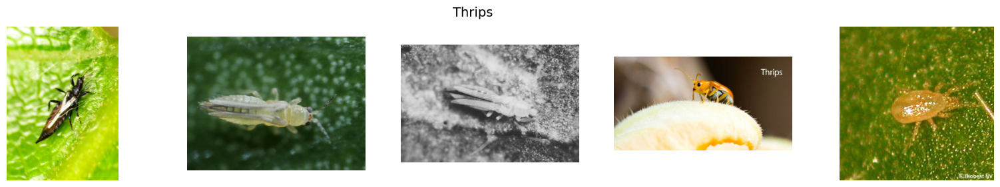

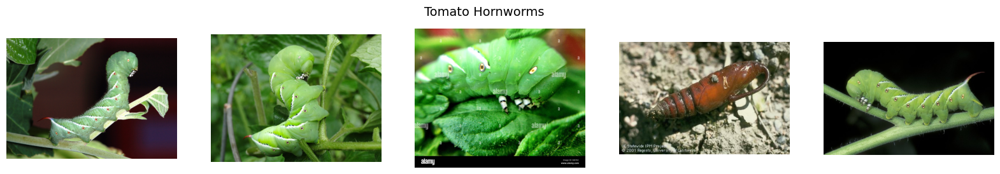

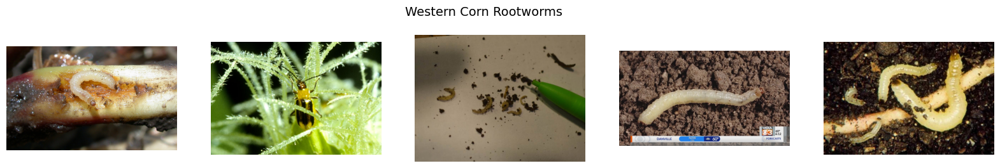

In [7]:
for class_name in classes:
    img_files = list((data_path / class_name).glob("*.[jp][pn]g"))  # jpg/png/jpeg
    sample_files = img_files[:5]

    plt.figure(figsize=(20, 3))
    plt.suptitle(class_name, fontsize=14)

    for i, img_path in enumerate(sample_files):
        img = Image.open(img_path)
        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.axis("off")
    plt.show()

## Exploratory Data Analysis


#### 1. Class Distribution & Imbalance

In [8]:
print("Total images per class:")
print(f"{'Kelas':<36} | {'Jumlah Gambar':>14}")
print("-" * 53)

for nama_kelas, jumlah in sorted(image_per_class.items()):
    print(f"{nama_kelas:<36} : {jumlah:>14}")

Total images per class:
Kelas                                |  Jumlah Gambar
-----------------------------------------------------
Africanized Honey Bees (Killer Bees) :             96
Aphids                               :             87
Armyworms                            :             94
Brown Marmorated Stink Bugs          :            114
Cabbage Loopers                      :            104
Citrus Canker                        :            104
Colorado Potato Beetles              :            112
Corn Borers                          :            114
Corn Earworms                        :            110
Fall Armyworms                       :            110
Fruit Flies                          :            100
Spider Mites                         :            118
Thrips                               :            109
Tomato Hornworms                     :            109
Western Corn Rootworms               :             97


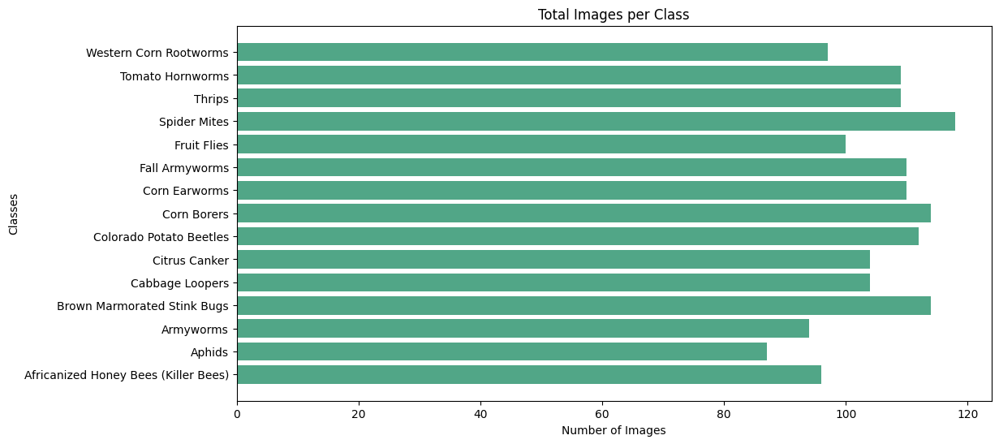

In [9]:
plt.figure(figsize=(12,6))
plt.barh(list(image_per_class.keys()), list(image_per_class.values()), color="#51A687")
plt.xlabel("Number of Images")
plt.ylabel("Classes")
plt.title("Total Images per Class")
plt.show()

#### 2. Check Duplicate Images

##### 2.1 Same Class

In [10]:
def get_hash(image_path):
    try:
        with Image.open(image_path) as img:
            img = img.convert("RGB")
            return hashlib.md5(img.tobytes()).hexdigest()
    except Exception:
        return None

In [11]:
seen_hashes = defaultdict(dict)
duplicates = defaultdict(list)

for root, _, files in os.walk(data_path):
    if not files:
        continue

    class_name = os.path.basename(root)
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(root, file)
            h = get_hash(path)
            if h is None:
                continue

            # Simpan hash per class
            if h in seen_hashes[class_name]:
                duplicates[class_name].append(path)
            else:
                seen_hashes[class_name][h] = path

c:\Python\environments\computer_vision\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [12]:
print("Duplicate Summary per Class:")
for cls, dup_list in duplicates.items():
    print(f"{cls:<36} : {len(dup_list):<2} duplicates")

total_duplicates = sum(len(v) for v in duplicates.values())
print(f"{'Total duplicates':<36} : {total_duplicates:<2} duplicates")

Duplicate Summary per Class:
Africanized Honey Bees (Killer Bees) : 2  duplicates
Aphids                               : 4  duplicates
Armyworms                            : 2  duplicates
Brown Marmorated Stink Bugs          : 1  duplicates
Citrus Canker                        : 1  duplicates
Colorado Potato Beetles              : 3  duplicates
Corn Borers                          : 1  duplicates
Corn Earworms                        : 3  duplicates
Spider Mites                         : 2  duplicates
Tomato Hornworms                     : 3  duplicates
Western Corn Rootworms               : 4  duplicates
Total duplicates                     : 26 duplicates


##### 2.2 Cross Class

In [13]:
cross_class_duplicates = defaultdict(list)
hash_to_paths = defaultdict(list)

# Kumpulkan semua hash dengan path-nya
for cls, hash_map in seen_hashes.items():
    for h, path in hash_map.items():
        hash_to_paths[h].append((cls, path))

# Cari hash yang muncul di lebih dari 1 class
for h, cls_paths in hash_to_paths.items():
    class_names = [cls for cls, _ in cls_paths]
    if len(set(class_names)) > 1:
        cross_class_duplicates[h] = cls_paths

In [14]:
print("Cross-Class Duplicate Summary:")
print(f"Total cross-class duplicates : {len(cross_class_duplicates)}")

Cross-Class Duplicate Summary:
Total cross-class duplicates : 24


In [15]:
if cross_class_duplicates:
    print("Contoh cross-class duplicate:")
    for i, (h, cls_paths) in enumerate(cross_class_duplicates.items()):
        if i >= 5:  # tampilkan 5 contoh pertama
            break
        print(f"\nDuplicate hash: {h}")
        for cls, p in cls_paths:
            print(f"  - {cls}: {p}")


Contoh cross-class duplicate:

Duplicate hash: fb7eefc1879dc225d1d9bf04d00a2636
  - Armyworms: farm_insects\Armyworms\Image_106.jpg
  - Fall Armyworms: farm_insects\Fall Armyworms\Image_93.jpg

Duplicate hash: 35752b3158cddea59ac216da2f71e054
  - Armyworms: farm_insects\Armyworms\Image_12.jpg
  - Fall Armyworms: farm_insects\Fall Armyworms\Image_19.jpg

Duplicate hash: 20a653d54ab804b79bafff82e3eb7ee9
  - Armyworms: farm_insects\Armyworms\Image_17.jpg
  - Fall Armyworms: farm_insects\Fall Armyworms\Image_39.jpg

Duplicate hash: 1b45f84145d9308a0e618048256f41f2
  - Armyworms: farm_insects\Armyworms\Image_18.jpg
  - Fall Armyworms: farm_insects\Fall Armyworms\Image_12.jpg

Duplicate hash: e98da0113bed150a099d02e93f360ac8
  - Armyworms: farm_insects\Armyworms\Image_2.jpg
  - Fall Armyworms: farm_insects\Fall Armyworms\Image_32.jpg


Total cross-class duplicate hashes: 24


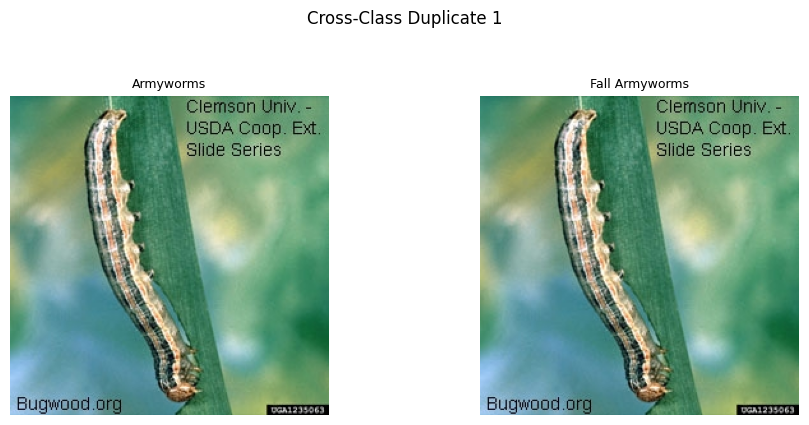

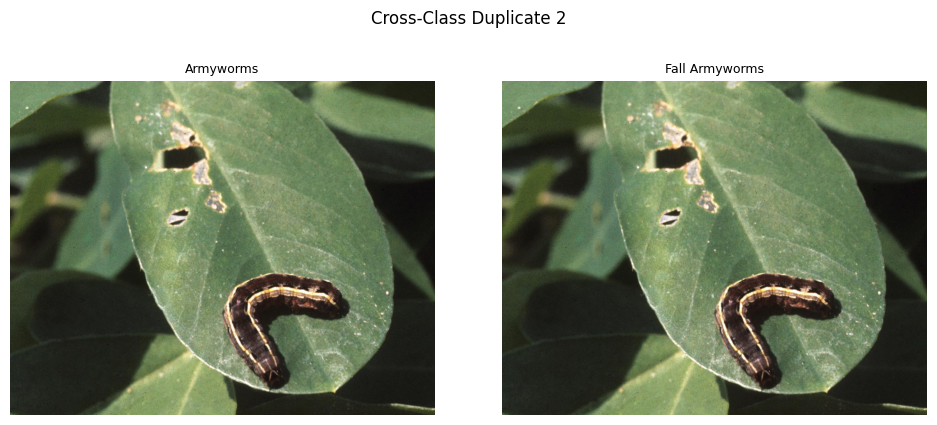

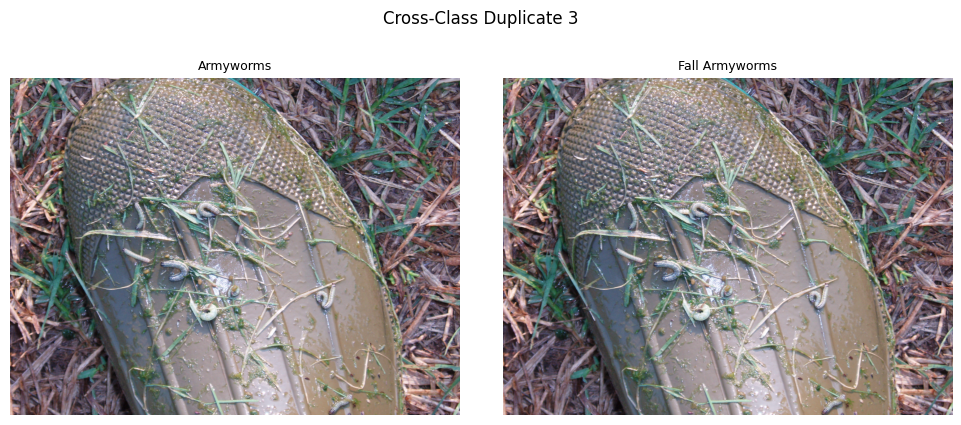

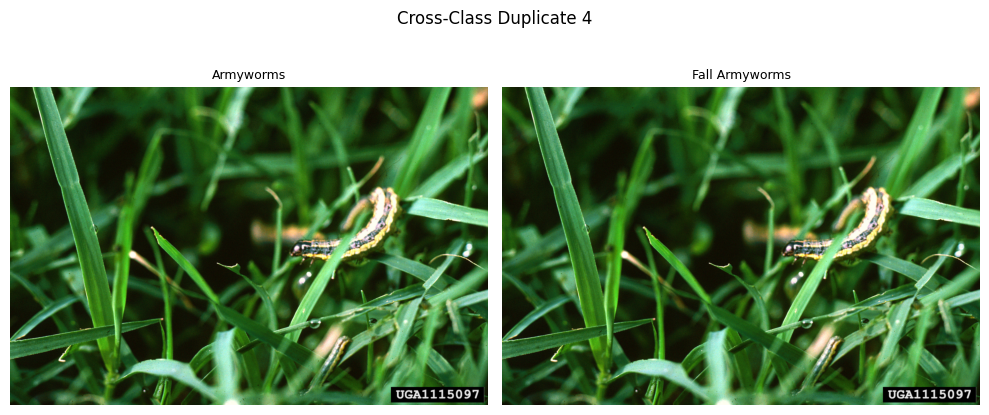

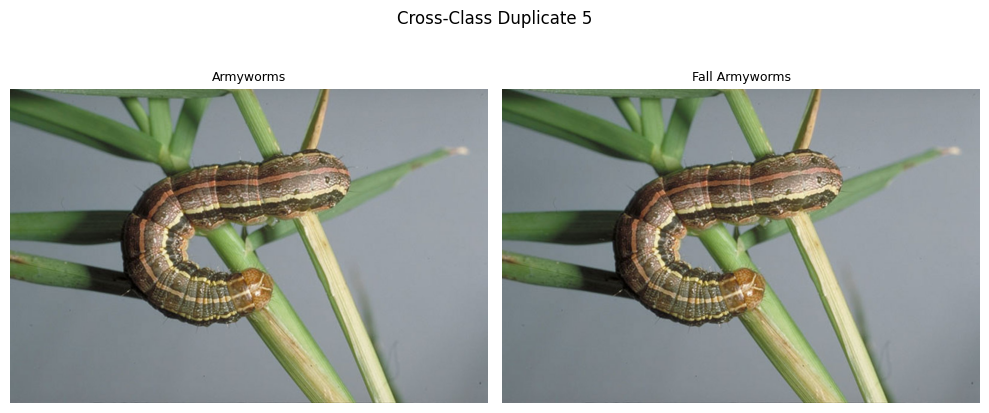

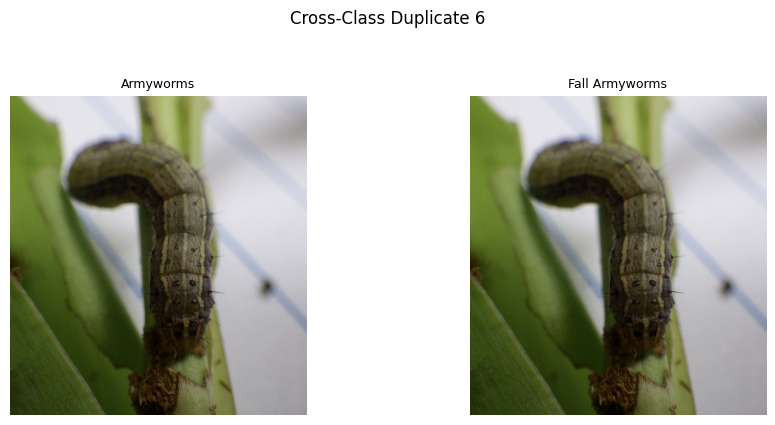

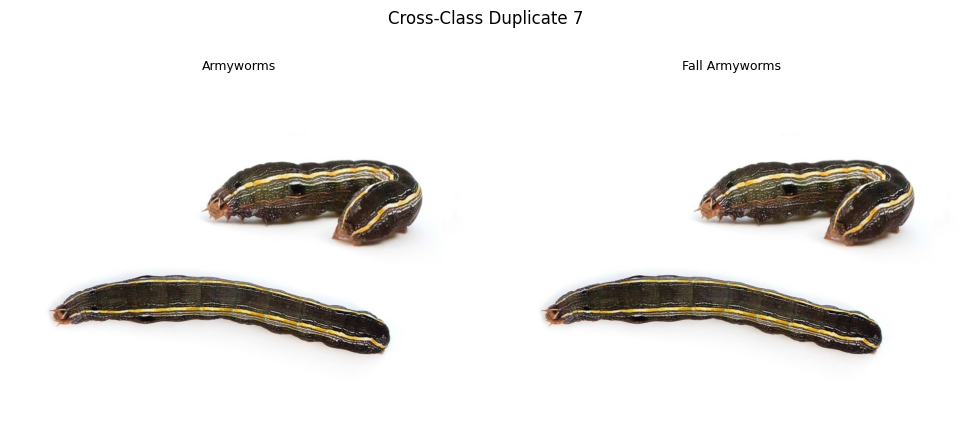

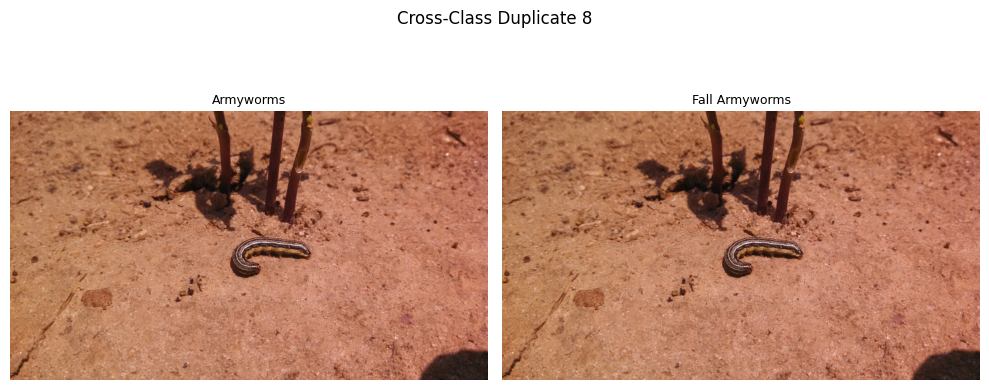

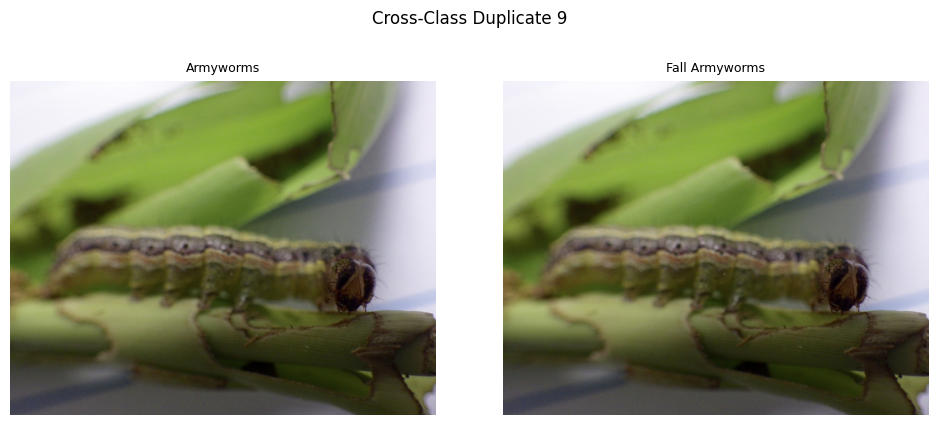

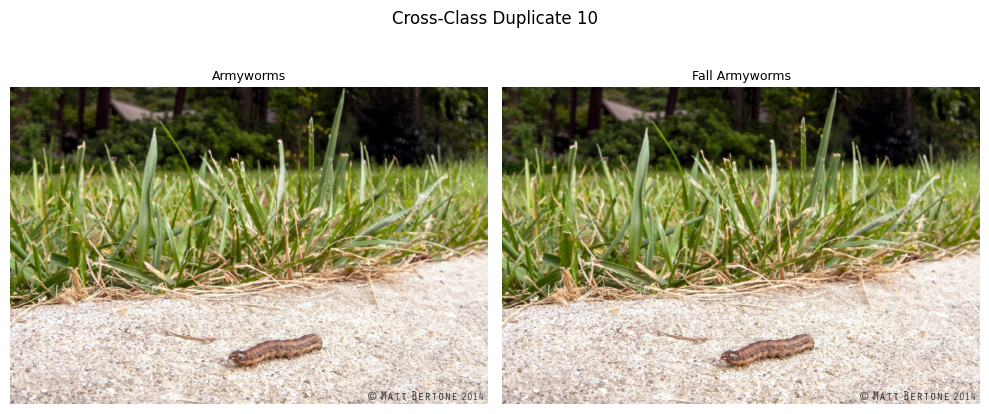

In [16]:
# Ambil list hash yang terdeteksi duplikat antar kelas
duplicate_hashes = list(cross_class_duplicates.keys())

print(f"Total cross-class duplicate hashes: {len(duplicate_hashes)}")

# Loop untuk menampilkan contoh gambar duplikat antar kelas
for j, dup_hash in enumerate(duplicate_hashes, start=1):
    cls_paths = cross_class_duplicates[dup_hash]
    
    plt.figure(figsize=(10, 4))
    for k, (cls, img_path) in enumerate(cls_paths):
        try:
            img = Image.open(img_path)
            plt.subplot(1, len(cls_paths), k + 1)
            plt.imshow(img)
            plt.title(cls, fontsize=9)
            plt.axis("off")
        except Exception:
            continue

    plt.suptitle(f"Cross-Class Duplicate {j}", fontsize=12, y=1.05)
    plt.tight_layout()
    plt.show()
    
    # Tampilkan maksimal 5 contoh pertama biar nggak kebanyakan
    if j >= 10:
        break


#### 3. Check Broken Image

In [17]:
broken_images = []
for class_name in tqdm(os.listdir(data_path), desc="Checking images"):
    class_dir = os.path.join(data_path, class_name)
    if not os.path.isdir(class_dir):
        continue

    for file in os.listdir(class_dir):
        file_path = os.path.join(class_dir, file)
        
        # Cek pakai PIL
        try:
            with Image.open(file_path) as img:
                _ = img.tobytes()

                if img.size[0] == 0 or img.size[1] == 0:
                    raise ValueError("Image has zero dimension")
            
        except (UnidentifiedImageError, OSError, ValueError) as e:
            broken_images.append(file_path)
            continue

        # Cek pakai OpenCV
        img_cv = cv2.imread(file_path)
        if img_cv is None:
            broken_images.append(file_path)
            continue

Checking images: 100%|██████████| 15/15 [00:43<00:00,  2.88s/it]


In [18]:
print("Total gambar rusak:", len(broken_images))
for img_path in broken_images:
    print(img_path)

Total gambar rusak: 12
farm_insects\Africanized Honey Bees (Killer Bees)\Image_23.gif
farm_insects\Aphids\Image_115.gif
farm_insects\Armyworms\Image_49.gif
farm_insects\Corn Borers\Image_4.gif
farm_insects\Fall Armyworms\Image_40.gif
farm_insects\Fall Armyworms\Image_68.gif
farm_insects\Fall Armyworms\Image_81.gif
farm_insects\Fruit Flies\Image_116.gif
farm_insects\Spider Mites\Image_62.gif
farm_insects\Western Corn Rootworms\Image_27.gif
farm_insects\Western Corn Rootworms\Image_35.gif
farm_insects\Western Corn Rootworms\Image_64.gif


#### 4. Check Distribution Size/ Dimension Per Class

In [19]:
dims = []

for class_name in os.listdir(data_path):
    class_dir = os.path.join(data_path, class_name)
    if os.path.isdir(class_dir):
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            try:
                with Image.open(file_path) as img:
                    w, h = img.size
                    dims.append({"class": class_name, "width": w, "height": h})
            except:
                continue

Jumlah total data dimensi: 1591
                                  class  width  height
0  Africanized Honey Bees (Killer Bees)   1160     650
1  Africanized Honey Bees (Killer Bees)   1279    1010
2  Africanized Honey Bees (Killer Bees)    200     200
3  Africanized Honey Bees (Killer Bees)    920     597
4  Africanized Honey Bees (Killer Bees)    900     665


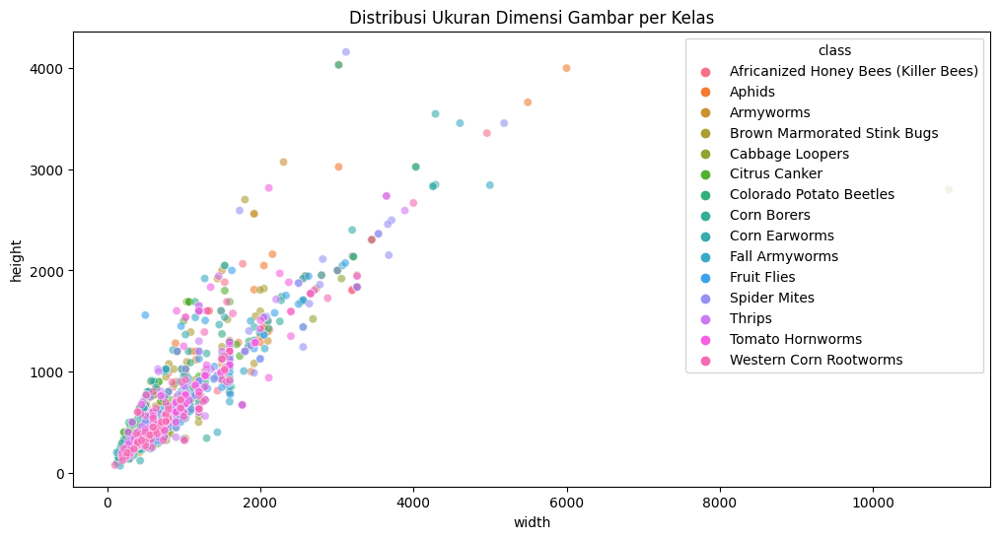

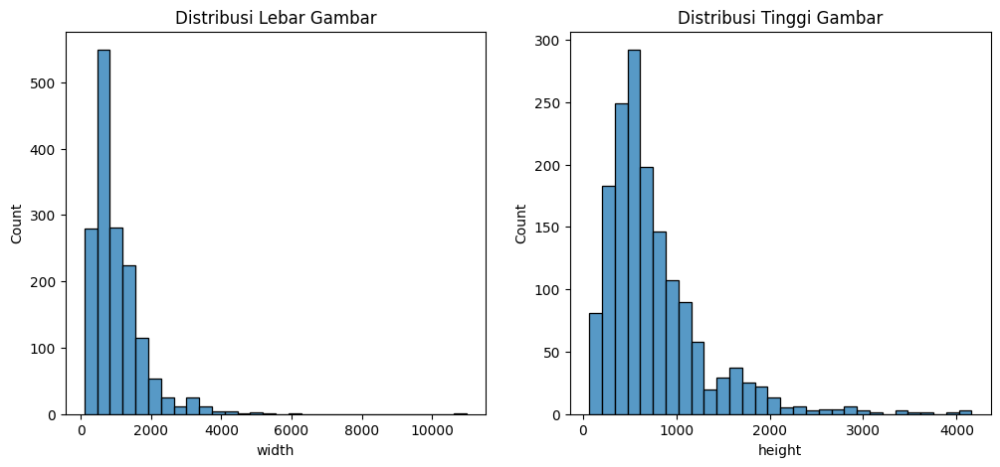

In [20]:
dims_df = pd.DataFrame(dims)

print("Jumlah total data dimensi:", len(dims_df))
print(dims_df.head())

# Plot distribusi
plt.figure(figsize=(12,6))
sns.scatterplot(data=dims_df, x="width", y="height", hue="class", alpha=0.6)
plt.title("Distribusi Ukuran Dimensi Gambar per Kelas")
plt.show()

# Distribusi histogram lebar & tinggi
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(dims_df["width"], bins=30, kde=False)
plt.title("Distribusi Lebar Gambar")

plt.subplot(1,2,2)
sns.histplot(dims_df["height"], bins=30, kde=False)
plt.title("Distribusi Tinggi Gambar")
plt.show()

#### 5. Check RGB

In [21]:
color_modes = []
for class_name in os.listdir(data_path):
    class_dir = os.path.join(data_path, class_name)
    if os.path.isdir(class_dir):
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            try:
                with Image.open(file_path) as img:
                    color_modes.append(img.mode)
            except:
                continue

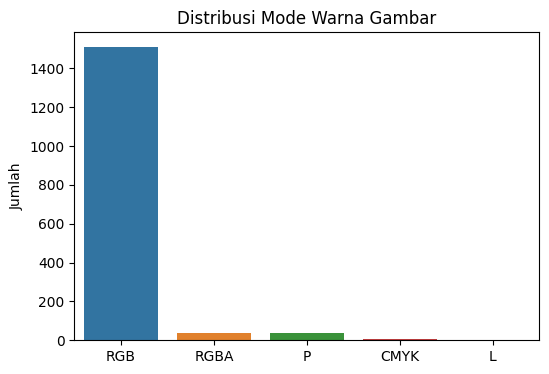

Counter({'RGB': 1510, 'RGBA': 38, 'P': 37, 'CMYK': 5, 'L': 1})

In [22]:
mode_counts = Counter(color_modes)

plt.figure(figsize=(6,4))
sns.barplot(x=list(mode_counts.keys()), y=list(mode_counts.values()))
plt.title("Distribusi Mode Warna Gambar")
plt.ylabel("Jumlah")
plt.show()

mode_counts

#### 6. Check Brightness

In [23]:
brightness_scores = {}

for class_name in os.listdir(data_path):
    class_dir = os.path.join(data_path, class_name)
    if os.path.isdir(class_dir):
        scores = []
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            try:
                img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
                if img is not None:
                    brightness = img.mean()
                    scores.append(brightness)
            except:
                continue
        brightness_scores[class_name] = scores

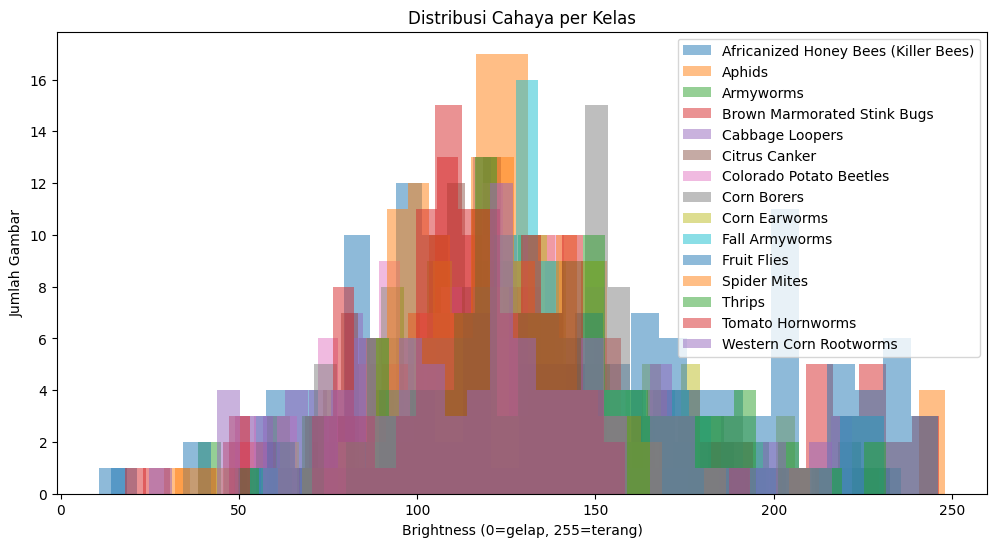

In [24]:
# Plot distribusi cahaya
plt.figure(figsize=(12,6))
for cls, scores in brightness_scores.items():
    plt.hist(scores, bins=30, alpha=0.5, label=cls)

plt.title("Distribusi Cahaya per Kelas")
plt.xlabel("Brightness (0=gelap, 255=terang)")
plt.ylabel("Jumlah Gambar")
plt.legend()
plt.show()

In [25]:
brightness = defaultdict(list)

for cls in sorted(os.listdir(data_path)):
    cls_path = os.path.join(data_path, cls)
    if os.path.isdir(cls_path):
        for file in os.listdir(cls_path):
            if file.lower().endswith(valid_exts):
                path = os.path.join(cls_path, file)
                try:
                    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        brightness[cls].append(np.mean(img))
                except:
                    pass

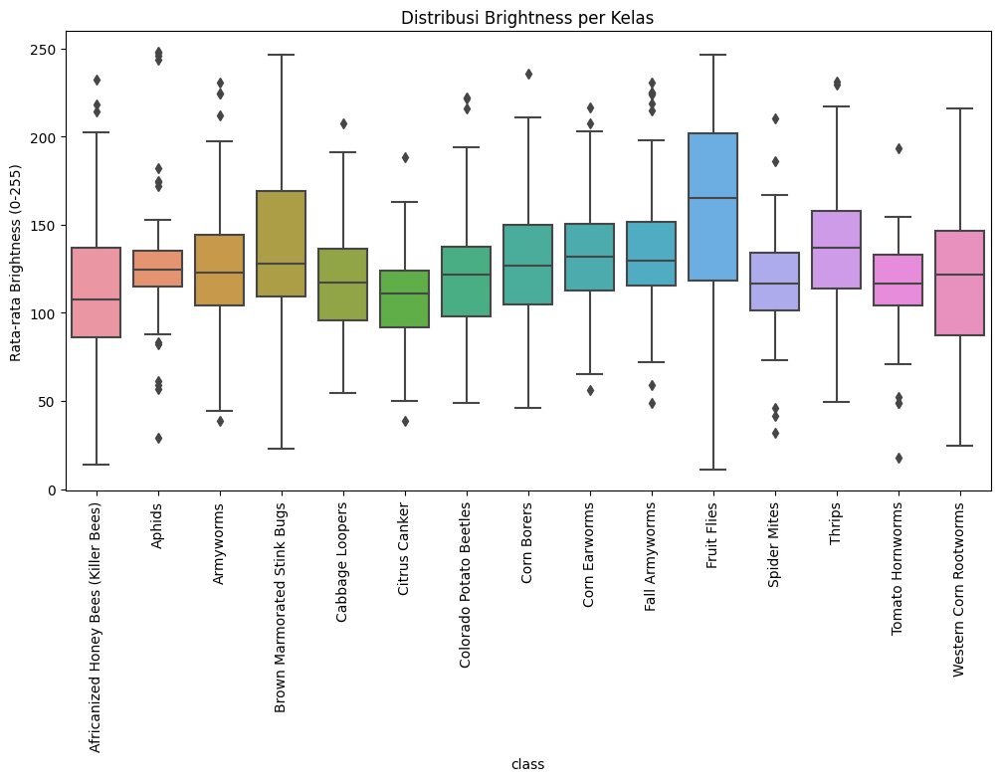

In [26]:
brightness_df = pd.DataFrame([
    {"class": cls, "brightness": b}
    for cls, values in brightness.items()
    for b in values
])

plt.figure(figsize=(12,6))
sns.boxplot(data=brightness_df, x="class", y="brightness")
plt.xticks(rotation=90)
plt.ylabel("Rata-rata Brightness (0-255)")
plt.title("Distribusi Brightness per Kelas")
plt.show()

#### 7. Check Blur

In [27]:
blur_scores = defaultdict(list)
laplacian_threshold = 100  # threshold blur

for cls in sorted(os.listdir(data_path)):
    cls_path = os.path.join(data_path, cls)
    if os.path.isdir(cls_path):
        for file in os.listdir(cls_path):
            if file.lower().endswith(valid_exts):
                path = os.path.join(cls_path, file)
                try:
                    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        score = cv2.Laplacian(img, cv2.CV_64F).var()
                        blur_scores[cls].append(score)
                except:
                    pass

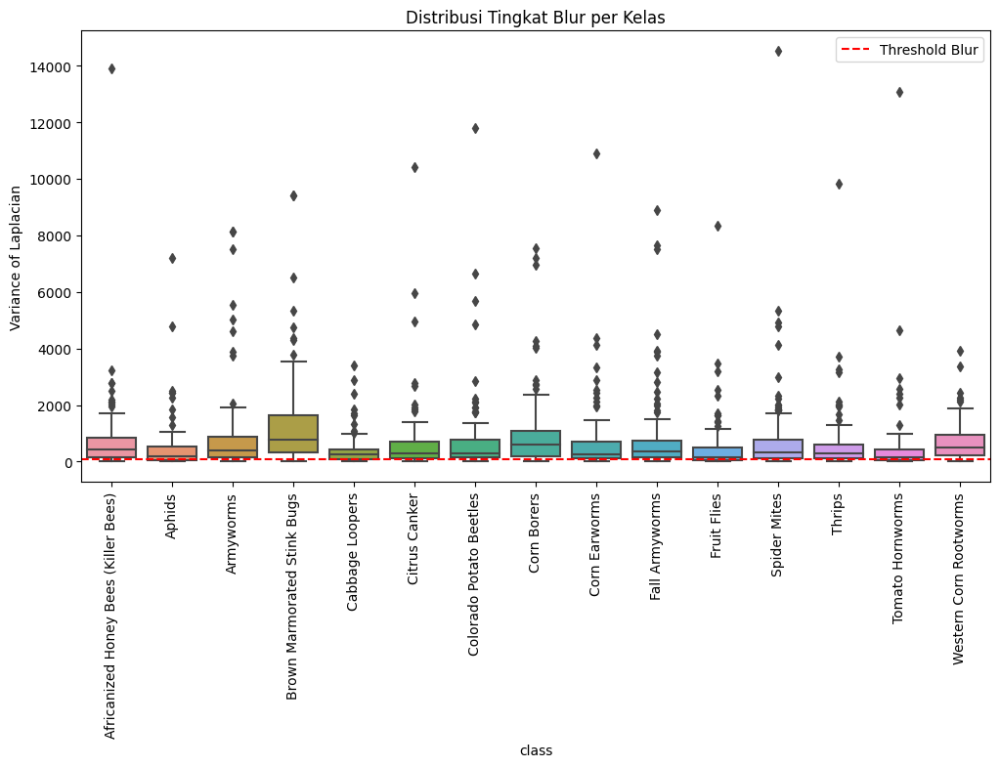

Total gambar dianggap blur (< 100): 345
Total gambar: 1578


In [28]:
blur_df = pd.DataFrame([
    {"class": cls, "blur": b}
    for cls, values in blur_scores.items()
    for b in values
])

plt.figure(figsize=(12,6))
sns.boxplot(data=blur_df, x="class", y="blur")
plt.axhline(laplacian_threshold, color="red", linestyle="--", label="Threshold Blur")
plt.legend()
plt.xticks(rotation=90)
plt.ylabel("Variance of Laplacian")
plt.title("Distribusi Tingkat Blur per Kelas")
plt.show()

total_blur = (blur_df["blur"] < laplacian_threshold).sum()
print(f"Total gambar dianggap blur (< {laplacian_threshold}): {total_blur}")
print(f"Total gambar: {len(blur_df)}")

## Preprocessing

In [67]:
output_path = "dataset_preprocessed"
os.makedirs(output_path, exist_ok=True)

#### 1. Remove Broken Images (Delete .gif Images)

In [68]:
for class_name in tqdm(os.listdir(data_path), desc="Processing classes"):
    folder_kelas_asli = os.path.join(data_path, class_name)
    if os.path.isdir(folder_kelas_asli):
        folder_kelas_tujuan = os.path.join(output_path, class_name)
        os.makedirs(folder_kelas_tujuan, exist_ok=True)

        for file in os.listdir(folder_kelas_asli):
            path_asal = os.path.join(folder_kelas_asli, file)
            path_tujuan = os.path.join(folder_kelas_tujuan, file)

            # Jika tidak ada di broken_images, skip
            if path_asal in broken_images:
                continue

            try:
                with Image.open(path_asal) as img:
                    img.verify()

                shutil.copy2(path_asal, path_tujuan)
                
            except (UnidentifiedImageError, OSError):
                print(f"File broken diskip: {path_asal}")
                continue

print("Success!")
print(f"Folder hasil: {output_path}")

Processing classes: 100%|██████████| 15/15 [00:05<00:00,  2.81it/s]

Success!
Folder hasil: dataset_preprocessed


In [69]:
total_preprocessed, image_per_class_preprocessed = count_total_images(output_path)
print(f"Total gambar asli                        : {total_images}")
print(f"Total gambar setelah hapus broken images : {total_preprocessed}")

Total gambar asli                        : 1578
Total gambar setelah hapus broken images : 1578


In [70]:
print("Total Images Summary:")
print(f"{'Kelas':<40} | {'Asli':>8} | {'Preprocessed':>13}")
print("-" * 62)

for kelas in sorted(image_per_class.keys()):
    asli = image_per_class.get(kelas, 0)
    pre = image_per_class_preprocessed.get(kelas, 0)
    print(f"{kelas:<40} | {asli:>8} | {pre:>13}")

Total Images Summary:
Kelas                                    |     Asli |  Preprocessed
--------------------------------------------------------------
Africanized Honey Bees (Killer Bees)     |       96 |            96
Aphids                                   |       87 |            87
Armyworms                                |       94 |            94
Brown Marmorated Stink Bugs              |      114 |           114
Cabbage Loopers                          |      104 |           104
Citrus Canker                            |      104 |           104
Colorado Potato Beetles                  |      112 |           112
Corn Borers                              |      114 |           114
Corn Earworms                            |      110 |           110
Fall Armyworms                           |      110 |           110
Fruit Flies                              |      100 |           100
Spider Mites                             |      118 |           118
Thrips                         

#### 2. Handling Duplicate Images

##### 2.1 Same Class

In [71]:
deleted_count = 0
deleted_per_class = defaultdict(int)

In [72]:
for class_name, duplicate_files in duplicates.items():
    class_folder = os.path.join(output_path, class_name)

    # Skip jika class foldernya tidak ada
    if not os.path.exists(class_folder):
        continue

    for duplicate_path in duplicate_files:
        file_name = os.path.basename(duplicate_path)
        target_file = os.path.join(class_folder, file_name)

        # Cek apakah ada yang terduplikat
        if os.path.exists(target_file):
            os.remove(target_file)
            deleted_per_class[class_name] += 1
            deleted_count += 1

In [73]:
print(f"{'Kelas':<40} | {'Duplicates Removed':>18}")
print("-" * 56)

for class_name, count in sorted(deleted_per_class.items()):
    print(f"{class_name:<40} | {count:>18}")

print("-" * 56)
print(f"{'Total duplicates removed':<40} | {deleted_count:>18}")

Kelas                                    | Duplicates Removed
--------------------------------------------------------
Africanized Honey Bees (Killer Bees)     |                  2
Aphids                                   |                  4
Armyworms                                |                  2
Brown Marmorated Stink Bugs              |                  1
Citrus Canker                            |                  1
Colorado Potato Beetles                  |                  3
Corn Borers                              |                  1
Corn Earworms                            |                  3
Spider Mites                             |                  2
Tomato Hornworms                         |                  3
Western Corn Rootworms                   |                  4
--------------------------------------------------------
Total duplicates removed                 |                 26


In [74]:
total_after_removed_duplicates, image_per_class_removed_duplicates= count_total_images(output_path)
print(f"Total gambar setelah hapus duplicates : {total_after_removed_duplicates}")

Total gambar setelah hapus duplicates : 1552


In [75]:
print("Total Images Summary After Removing Duplicates:")
print(f"{'Kelas':<40} | {'Before':>8} | {'After':>13}")
print("-" * 62)

for kelas in sorted(image_per_class.keys()):
    before = image_per_class_preprocessed.get(kelas, 0)
    after = image_per_class_removed_duplicates.get(kelas, 0)
    print(f"{kelas:<40} | {before:>8} | {after:>13}")

Total Images Summary After Removing Duplicates:
Kelas                                    |   Before |         After
--------------------------------------------------------------
Africanized Honey Bees (Killer Bees)     |       96 |            94
Aphids                                   |       87 |            83
Armyworms                                |       94 |            92
Brown Marmorated Stink Bugs              |      114 |           113
Cabbage Loopers                          |      104 |           104
Citrus Canker                            |      104 |           103
Colorado Potato Beetles                  |      112 |           109
Corn Borers                              |      114 |           113
Corn Earworms                            |      110 |           107
Fall Armyworms                           |      110 |           110
Fruit Flies                              |      100 |           100
Spider Mites                             |      118 |           116
Thrip

##### 2.2 Cross Class

In [76]:
deleted_total_cross = 0
deleted_per_class_cross = defaultdict(int)

for h, cls_paths in cross_class_duplicates.items():
    for cls, original_path in cls_paths:
        file_name = os.path.basename(original_path)
        target_file = os.path.join(output_path, cls, file_name)

        # Cek file apakah ada di preprocessed folder, hapus jika ada
        if os.path.exists(target_file):
            os.remove(target_file)
            deleted_per_class_cross[cls] += 1
            deleted_total_cross += 1

In [77]:
print(f"{'Kelas':<36} | {'Cross-class Removed':>20}")
print("-" * 59)
for cls, count in sorted(deleted_per_class_cross.items()):
    print(f"{cls:<36} | {count:>20}")
print("-" * 59)
print(f"{'Total cross-class duplicates removed':<35} | {deleted_total_cross:>20}")

Kelas                                |  Cross-class Removed
-----------------------------------------------------------
Armyworms                            |                   24
Fall Armyworms                       |                   24
-----------------------------------------------------------
Total cross-class duplicates removed |                   48


In [78]:
total_after_removed_duplicates_cross, image_per_class_removed_duplicates_cross = count_total_images(output_path)
print(f"Total gambar setelah hapus cross-class duplicates : {total_after_removed_duplicates_cross}")

Total gambar setelah hapus cross-class duplicates : 1504


In [79]:
print("Total Images Summary After Removing Cross-Class Duplicates:")
print(f"{'Kelas':<40} | {'Before':>8} | {'After':>13}")
print("-" * 62)

for kelas in sorted(image_per_class.keys()):
    before = image_per_class_removed_duplicates.get(kelas, 0)
    after = image_per_class_removed_duplicates_cross.get(kelas, 0)
    print(f"{kelas:<40} | {before:>8} | {after:>13}")

Total Images Summary After Removing Cross-Class Duplicates:
Kelas                                    |   Before |         After
--------------------------------------------------------------
Africanized Honey Bees (Killer Bees)     |       94 |            94
Aphids                                   |       83 |            83
Armyworms                                |       92 |            68
Brown Marmorated Stink Bugs              |      113 |           113
Cabbage Loopers                          |      104 |           104
Citrus Canker                            |      103 |           103
Colorado Potato Beetles                  |      109 |           109
Corn Borers                              |      113 |           113
Corn Earworms                            |      107 |           107
Fall Armyworms                           |      110 |            86
Fruit Flies                              |      100 |           100
Spider Mites                             |      116 |        

#### 3. Adjust Brightness

In [80]:
def get_brightness_score(input_dir):
    brightness_scores = {}

    for class_name in os.listdir(input_dir):
        class_dir = os.path.join(input_dir, class_name)

        scores = []
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

            brightness = img.mean()
            scores.append(brightness)
        
        brightness_scores[class_name] = scores
    
    return brightness_scores

In [81]:
def compute_brightness_factors(brightness_scores, target_brightness=140):
    class_avg = {
        cls: np.mean(scores) if len(scores) > 0 else target_brightness
        for cls, scores in brightness_scores.items()
    }

    class_factors = {
        cls: np.clip(target_brightness / (avg + 1e-8), 0.6, 1.6)
        for cls, avg in class_avg.items()
    }

    print("Rata-rata brightness per kelas:")
    for cls, val in class_avg.items():
        print(f"{cls:<40}: {val:.2f}")

    return class_factors

In [82]:
def adjust_brightness_dataset(dataset_dir, target_brightness=140):
    brightness_scores = get_brightness_score(dataset_dir)
    brightness_factors = compute_brightness_factors(brightness_scores, target_brightness)

    for class_name in tqdm(os.listdir(dataset_dir), desc="Adjusting brightness"):
        class_path = os.path.join(dataset_dir, class_name)
    
        factor = brightness_factors.get(class_name, 1.0)

        for file in os.listdir(class_path):
            path_asal = os.path.join(class_path, file)
            temp_path = os.path.join(class_path, f"temp_{file}")

            try:
                img = Image.open(path_asal).convert('RGB')
                enhancer = ImageEnhance.Brightness(img)
                adjusted_img = enhancer.enhance(factor)

                adjusted_img.save(temp_path)

                os.remove(path_asal)
                os.rename(temp_path, path_asal)

            except Exception as e:
                print(f"Gagal proses {path_asal}: {e}")
                if os.path.exists(temp_path):
                    os.remove(temp_path)
                continue

    print("Success")
    print(f"Hasil tersimpan di folder: {dataset_dir}")

In [83]:
dataset_dir = "dataset_preprocessed"
adjust_brightness_dataset(dataset_dir, target_brightness=140)

Rata-rata brightness per kelas:
Africanized Honey Bees (Killer Bees)    : 113.63
Aphids                                  : 127.42
Armyworms                               : 124.11
Brown Marmorated Stink Bugs             : 140.89
Cabbage Loopers                         : 117.66
Citrus Canker                           : 109.75
Colorado Potato Beetles                 : 120.76
Corn Borers                             : 128.05
Corn Earworms                           : 133.10
Fall Armyworms                          : 137.29
Fruit Flies                             : 159.54
Spider Mites                            : 118.02
Thrips                                  : 137.09
Tomato Hornworms                        : 114.94
Western Corn Rootworms                  : 118.83


Adjusting brightness:  20%|██        | 3/15 [00:08<00:30,  2.57s/it]c:\Python\environments\computer_vision\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
Adjusting brightness: 100%|██████████| 15/15 [01:01<00:00,  4.09s/it]

Success
Hasil tersimpan di folder: dataset_preprocessed


#### 4. Image Sharpening (Unsharp Masking)

In [84]:
def get_blur_score(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    return cv2.Laplacian(img, cv2.CV_64F).var()

In [85]:
def sharpen_image(img, strength, blur_ksize=(3,3)):
    img_np = np.array(img)
    
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    blurred = cv2.GaussianBlur(img_bgr, blur_ksize, 0)
    
    sharpened = cv2.addWeighted(img_bgr, 1 + strength, blurred, -strength, 0)
    sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)

    sharpened_rgb = cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB)
    
    return Image.fromarray(sharpened_rgb)

In [86]:
def sharpen_dataset(dataset_dir, laplacian_threshold=100):
    for class_name in tqdm(os.listdir(dataset_dir), desc="Adaptive sharpening"):
        class_path = os.path.join(dataset_dir, class_name)

        for file in os.listdir(class_path):
            file_path = os.path.join(class_path, file)

            try:
                score = get_blur_score(file_path)
                
                if score < laplacian_threshold:
                    # Semakin blur, semakin kuat tingkat sharpening
                    strength = 1.0 if score < 50 else 0.7

                    with Image.open(file_path).convert('RGB') as img:
                        sharpened_img = sharpen_image(img, strength=strength)

                        temp_path = os.path.join(class_path, f"temp_{file}")
                        sharpened_img.save(temp_path)

                        os.remove(file_path)
                        os.rename(temp_path, file_path)

            except Exception as e:
                print(f"Gagal proses {file_path}: {e}")
                continue

    print("Success")
    print(f"Hasil tersimpan di folder: {dataset_dir}")

In [87]:
sharpen_dataset("dataset_preprocessed")

Adaptive sharpening: 100%|██████████| 15/15 [01:32<00:00,  6.16s/it]

Success
Hasil tersimpan di folder: dataset_preprocessed


#### Split Dataset

In [88]:
source_dir = "dataset_preprocessed"
output_dir = "dataset_split"

splits = ["train", "val", "test"]
ratios = [0.7, 0.15, 0.15]

for split in splits:
    os.makedirs(os.path.join(output_dir, split), exist_ok=True)

In [89]:
classes = os.listdir(source_dir)

for cls in classes:
    class_dir = os.path.join(source_dir, cls)
    images = os.listdir(class_dir)
    random.shuffle(images)

    total = len(images)
    train_end = int(total * ratios[0])
    val_end = train_end + int(total * ratios[1])

    train_imgs = images[:train_end]
    val_imgs = images[train_end:val_end]
    test_imgs = images[val_end:]

    # Create class folders
    for split in splits:
        os.makedirs(os.path.join(output_dir, split, cls), exist_ok=True)

    # Copy images
    for img in train_imgs:
        shutil.copy(
            os.path.join(class_dir, img),
            os.path.join(output_dir, "train", cls, img)
        )

    for img in val_imgs:
        shutil.copy(
            os.path.join(class_dir, img),
            os.path.join(output_dir, "val", cls, img)
        )

    for img in test_imgs:
        shutil.copy(
            os.path.join(class_dir, img),
            os.path.join(output_dir, "test", cls, img)
        )

print("Success")

Success


In [90]:
total_count = 0

for split in splits:
    split_path = os.path.join(output_dir, split)
    split_total = 0

    print(f"--- {split.upper()} ---")
    
    for cls in os.listdir(split_path):
        class_path = os.path.join(split_path, cls)
        count = len(os.listdir(class_path))
        split_total += count
        print(f"{cls:<40} : {count}")

    print(f"Total {split:<35}: {split_total}\n")
    total_count += split_total

print("======================================")
print(f"Total Images: {total_count}")

--- TRAIN ---
Africanized Honey Bees (Killer Bees)     : 65
Aphids                                   : 58
Armyworms                                : 48
Brown Marmorated Stink Bugs              : 79
Cabbage Loopers                          : 72
Citrus Canker                            : 72
Colorado Potato Beetles                  : 76
Corn Borers                              : 79
Corn Earworms                            : 74
Fall Armyworms                           : 60
Fruit Flies                              : 70
Spider Mites                             : 81
Thrips                                   : 76
Tomato Hornworms                         : 74
Western Corn Rootworms                   : 65
Total train                              : 1049

--- VAL ---
Africanized Honey Bees (Killer Bees)     : 14
Aphids                                   : 12
Armyworms                                : 10
Brown Marmorated Stink Bugs              : 16
Cabbage Loopers                          : 15
Citru

# Model: EfficientNet B3

In [6]:
IMG_SIZE = (300, 300)
BATCH_SIZE = 32

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "dataset_split/train",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "dataset_split/val",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "dataset_split/test",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 1049 files belonging to 15 classes.
Found 218 files belonging to 15 classes.
Found 238 files belonging to 15 classes.


In [7]:
class_names = train_ds.class_names
num_classes = len(class_names)
print(class_names)
print(num_classes)

['Africanized Honey Bees (Killer Bees)', 'Aphids', 'Armyworms', 'Brown Marmorated Stink Bugs', 'Cabbage Loopers', 'Citrus Canker', 'Colorado Potato Beetles', 'Corn Borers', 'Corn Earworms', 'Fall Armyworms', 'Fruit Flies', 'Spider Mites', 'Thrips', 'Tomato Hornworms', 'Western Corn Rootworms']
15


In [8]:
train_ds = train_ds.map(lambda x, y: (preprocess_input(x), y))
val_ds   = val_ds.map(lambda x, y: (preprocess_input(x), y))
test_ds  = test_ds.map(lambda x, y: (preprocess_input(x), y))

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [9]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.shuffle(1000).prefetch(AUTOTUNE)
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [10]:
for batch, _ in train_ds.take(1):
    print(tf.reduce_min(batch), tf.reduce_max(batch))

tf.Tensor(0.0, shape=(), dtype=float32) tf.Tensor(255.0, shape=(), dtype=float32)


In [31]:
pretrained_model = tf.keras.applications.EfficientNetB3(
    include_top=False,
    weights="imagenet",
    input_shape=(300, 300, 3),
)

pretrained_model.trainable = True   # Fine-tune EfficientNet B3

# Freeze layer awal yang general
for layer in pretrained_model.layers[:-30]:
    layer.trainable = False

In [32]:
index = len(pretrained_model.layers) - 30
print("Index:", index)
print("Layer name:", pretrained_model.layers[index].name)

Index: 355
Layer name: block7a_expand_bn


In [33]:
model = models.Sequential([
    pretrained_model,
    layers.GlobalAveragePooling2D(),

    layers.Dense(512, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),

    layers.Dense(256, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),

    layers.Dense(128, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),

    layers.Dense(num_classes, activation="softmax")
])

In [34]:
pretrained_model.summary()

Model: "efficientnetb3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 300, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_4 (Rescaling)        (None, 300, 300, 3)  0           ['input_3[0][0]']                
                                                                                                  
 normalization_2 (Normalization  (None, 300, 300, 3)  7          ['rescaling_4[0][0]']            
 )                                                                                                
                                                                                     

In [35]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional)  (None, 10, 10, 1536)     10783535  
                                                                 
 global_average_pooling2d_2   (None, 1536)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_8 (Dense)             (None, 512)               786944    
                                                                 
 batch_normalization_6 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 dropout_6 (Dropout)         (None, 512)               0         
                                                                 
 dense_9 (Dense)             (None, 256)              

In [36]:
train_labels_list = []

for _, labels in train_ds.unbatch():
    train_labels_list.append(int(labels.numpy()))

class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.arange(num_classes),
    y=train_labels_list
)

class_weights = dict(enumerate(class_weights))
print(class_weights)

{0: 1.0758974358974358, 1: 1.2057471264367816, 2: 1.4569444444444444, 3: 0.8852320675105485, 4: 0.9712962962962963, 5: 0.9712962962962963, 6: 0.9201754385964912, 7: 0.8852320675105485, 8: 0.945045045045045, 9: 1.1655555555555555, 10: 0.9990476190476191, 11: 0.8633744855967078, 12: 0.9201754385964912, 13: 0.945045045045045, 14: 1.0758974358974358}


In [37]:
model.compile(
    optimizer=tfa.optimizers.AdamW(
        learning_rate=1e-4,
        weight_decay=5e-6
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [38]:
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

In [39]:
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    min_lr=1e-6
)

In [41]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=40,
    class_weight=class_weights,
    callbacks=[lr_scheduler, early_stop]
)

Epoch 1/40
33/33 [==============================] - 86s 3s/step - loss: 3.6853 - accuracy: 0.1058 - val_loss: 2.6295 - val_accuracy: 0.1697 - lr: 1.0000e-04
Epoch 2/40
33/33 [==============================] - 83s 2s/step - loss: 3.3438 - accuracy: 0.1392 - val_loss: 2.5312 - val_accuracy: 0.2110 - lr: 1.0000e-04
Epoch 3/40
33/33 [==============================] - 81s 2s/step - loss: 3.0964 - accuracy: 0.1992 - val_loss: 2.4076 - val_accuracy: 0.2798 - lr: 1.0000e-04
Epoch 4/40
33/33 [==============================] - 84s 3s/step - loss: 2.7732 - accuracy: 0.2345 - val_loss: 2.2465 - val_accuracy: 0.3486 - lr: 1.0000e-04
Epoch 5/40
33/33 [==============================] - 190s 6s/step - loss: 2.4559 - accuracy: 0.2850 - val_loss: 2.0896 - val_accuracy: 0.4220 - lr: 1.0000e-04
Epoch 6/40
33/33 [==============================] - 151s 4s/step - loss: 2.2647 - accuracy: 0.3384 - val_loss: 1.9489 - val_accuracy: 0.4771 - lr: 1.0000e-04
Epoch 7/40
33/33 [==============================] - 176s

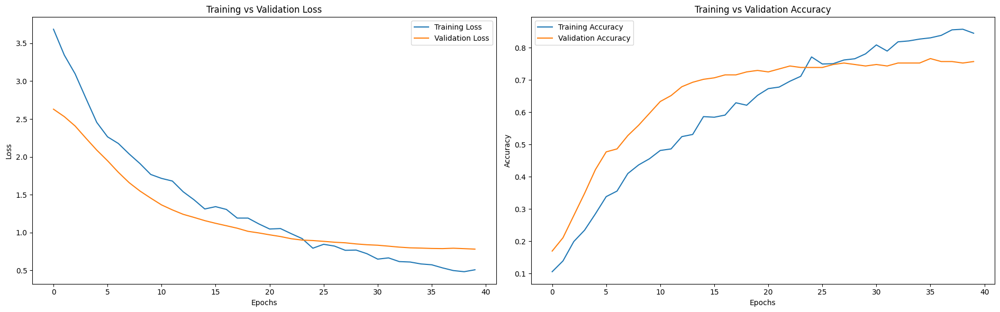

In [42]:
plt.figure(figsize=(19, 6))

# Loss
plt.subplot(1, 2, 1)
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title("Training vs Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Training vs Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# Test Result & Plotting

In [43]:
test_loss, test_acc = model.evaluate(test_ds)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

8/8 [==============================] - 13s 2s/step - loss: 0.6576 - accuracy: 0.7941
Test Accuracy: 0.7941176295280457
Test Loss: 0.6576101183891296


In [44]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    preds = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

1/1 [==============================] - 3s 3s/step


In [45]:
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

Classification Report:
                                      precision    recall  f1-score   support

Africanized Honey Bees (Killer Bees)       1.00      0.93      0.97        15
                              Aphids       0.77      0.77      0.77        13
                           Armyworms       0.38      0.45      0.42        11
         Brown Marmorated Stink Bugs       1.00      0.83      0.91        18
                     Cabbage Loopers       1.00      0.76      0.87        17
                       Citrus Canker       0.84      1.00      0.91        16
             Colorado Potato Beetles       0.94      0.94      0.94        17
                         Corn Borers       0.60      0.67      0.63        18
                       Corn Earworms       0.73      0.65      0.69        17
                      Fall Armyworms       0.26      0.36      0.30        14
                         Fruit Flies       0.93      0.93      0.93        15
                        Spider Mites    

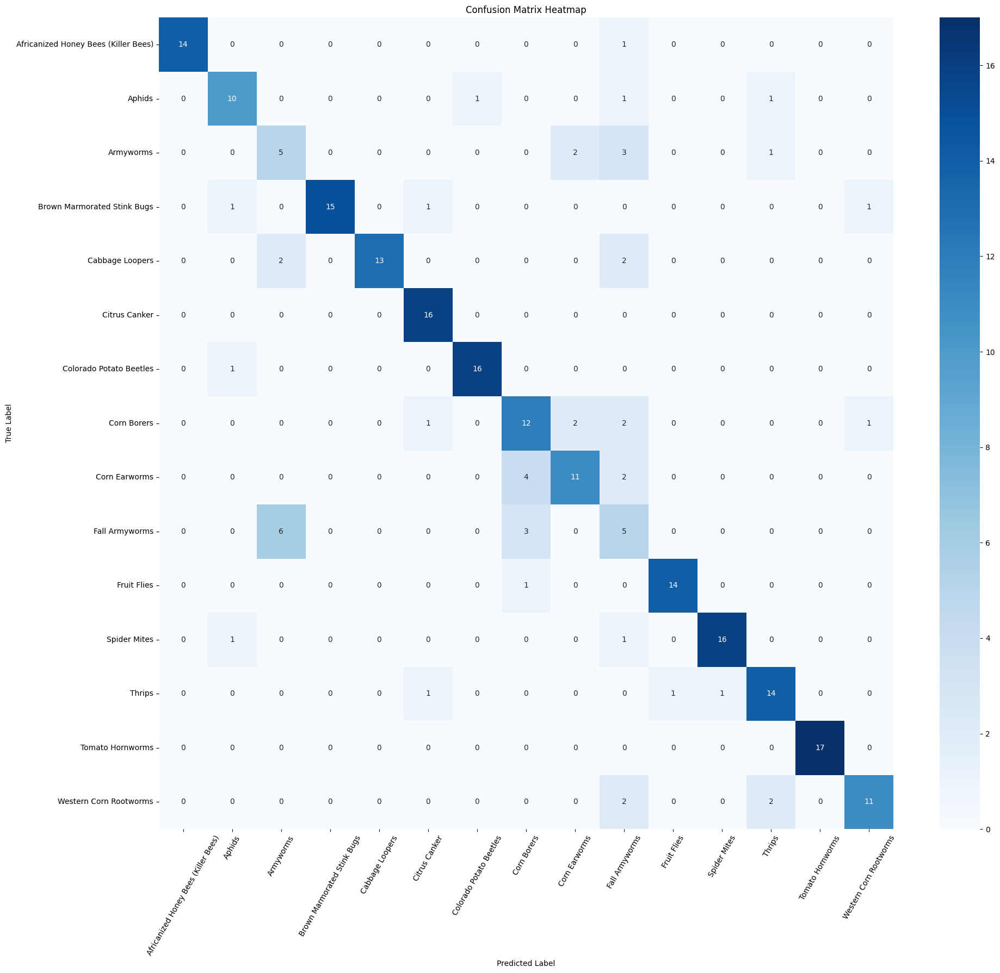

In [46]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(20, 18))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.xticks(rotation=60)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Grad-CAM

In [47]:
def gradcam_heatmap(img_array, model, base_model, last_conv_name):
    last_conv_layer = base_model.get_layer(last_conv_name)

    x = base_model.output
    head_layers = model.layers[1:]

    for layer in head_layers:
        x = layer(x)

    grad_model = tf.keras.models.Model(
        inputs=base_model.input,
        outputs=[last_conv_layer.output, x]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        pred_index = tf.argmax(predictions[0])
        pred_output = predictions[:, pred_index]

    # Grads shape = (1, H, W, channels)
    grads = tape.gradient(pred_output, conv_outputs)

    # Compute channel importance
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]  # Drop batch dim

    # Weighted sum of channels
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    # Normalize
    heatmap = np.maximum(heatmap.numpy(), 0)
    denom = heatmap.max() if heatmap.max() != 0 else 1e-10
    heatmap /= denom

    return heatmap

### Test Grad-CAM

In [48]:
# Test 1 gambar dari test_ds
for images, labels in test_ds.take(1):
    img = images[3].numpy()
    true_label = labels[0].numpy()
    break

img_array = np.expand_dims(img, axis=0)

base_model = model.layers[0]    # EfficientNetB3
last_conv_name = "top_conv"

heatmap = gradcam_heatmap(
    img_array,
    model=model,
    base_model=base_model,
    last_conv_name=last_conv_name
)

# Ubah ukuran heatmap ke ukuran asli gambar untuk overlay
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
superimposed_img = heatmap_color * 0.4 + img.astype(np.uint8)

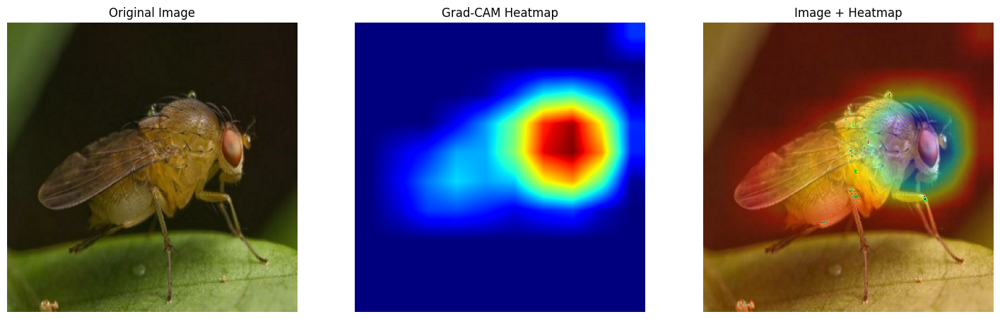

In [49]:
# Plotting
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(img.astype("uint8"))
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Grad-CAM Heatmap")
plt.imshow(heatmap_resized, cmap="jet")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Image + Heatmap")
plt.imshow(superimposed_img.astype("uint8"))
plt.axis("off")

plt.show()

# Save Model

In [53]:
model.save_weights("efficientnetb3_model_weights.h5")
print("Model saved...")

Model saved...


### Test Load Model

In [56]:
def build_model(num_classes, freeze_layers=-30):
    pretrained_model = tf.keras.applications.EfficientNetB3(
        include_top=False,
        weights="imagenet",
        input_shape=(300, 300, 3),
    )

    pretrained_model.trainable = True

    # Freeze layer awal
    for layer in pretrained_model.layers[:freeze_layers]:
        layer.trainable = False

    model = models.Sequential([
        pretrained_model,
        layers.GlobalAveragePooling2D(),

        layers.Dense(512, activation="relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),

        layers.Dense(256, activation="relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),

        layers.Dense(128, activation="relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),

        layers.Dense(num_classes, activation="softmax")
    ])
    
    return model

In [57]:
loaded_model = build_model(num_classes, freeze_layers=-30)

loaded_model.load_weights("efficientnetb3_model_weights.h5")
print("Weights loaded successfully!")

Weights loaded successfully!


In [58]:
loaded_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [59]:
test_loss, test_acc = loaded_model.evaluate(test_ds)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

8/8 [==============================] - 17s 2s/step - loss: 0.6576 - accuracy: 0.7941
Test Loss: 0.6576102375984192
Test Accuracy: 0.7941176295280457
